In [38]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import pytesseract
from PIL import Image

In [2]:
image_file = "Images/page_01.jpg"
img = cv2.imread(image_file)

In [3]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

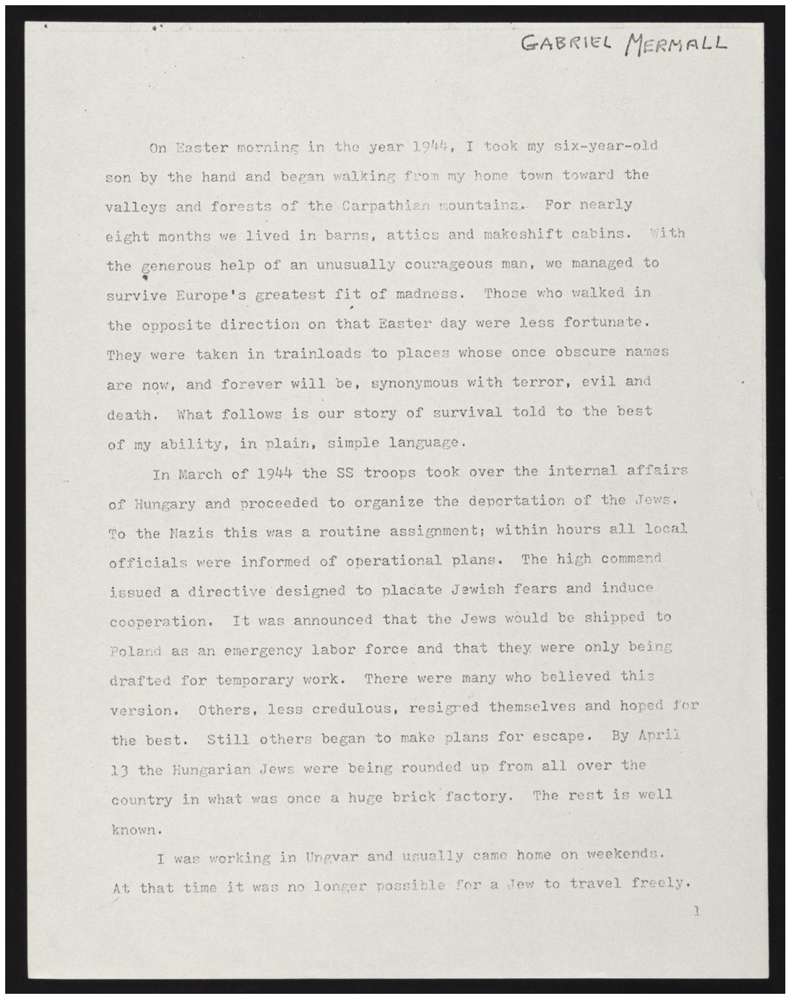

In [4]:
display(image_file)

Inverted Images

(-0.5, 1199.5, 1521.5, -0.5)

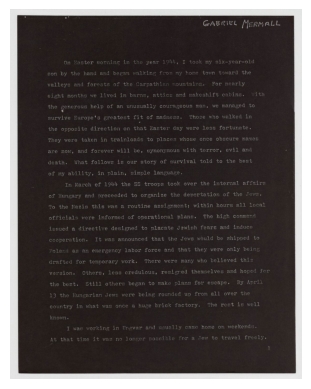

In [5]:
inverted_image = cv2.bitwise_not(img)
plt.imshow(inverted_image)
plt.axis('off')  

Binarization

In [6]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

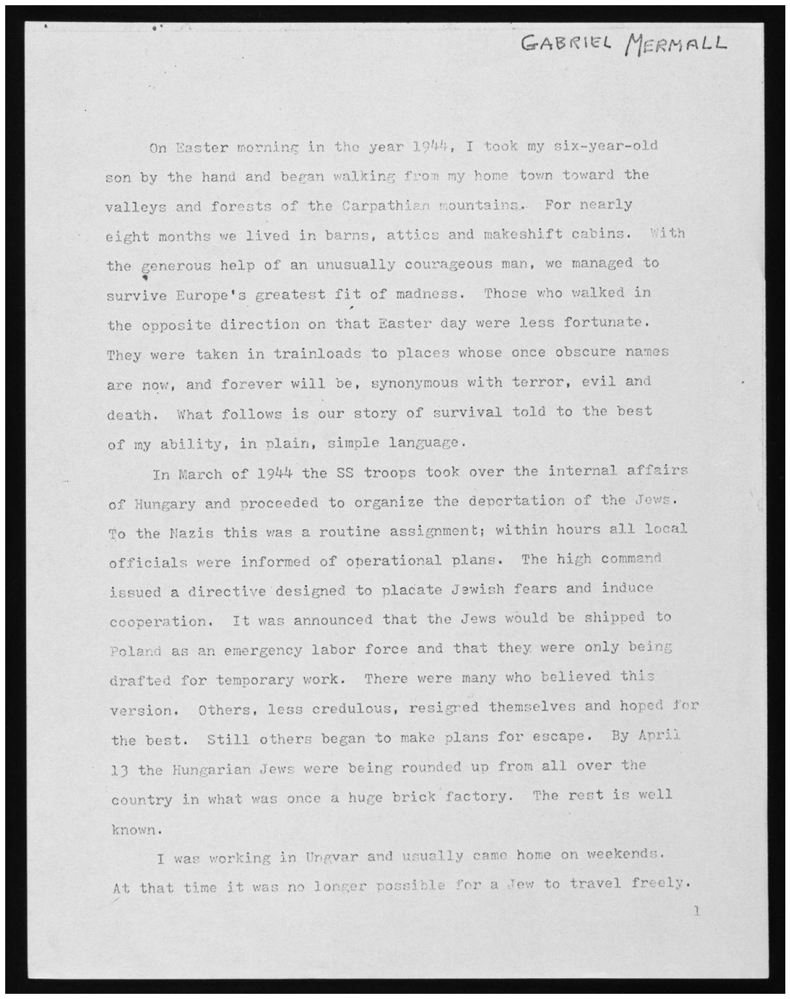

In [7]:
gray_image = grayscale(img)
cv2.imwrite("output/gray_scale_img.jpg", gray_image)
display("output/gray_scale_img.jpg")

# gray_image = grayscale(img)
# cv2.imwrite("output/gray.jpg", gray_image)


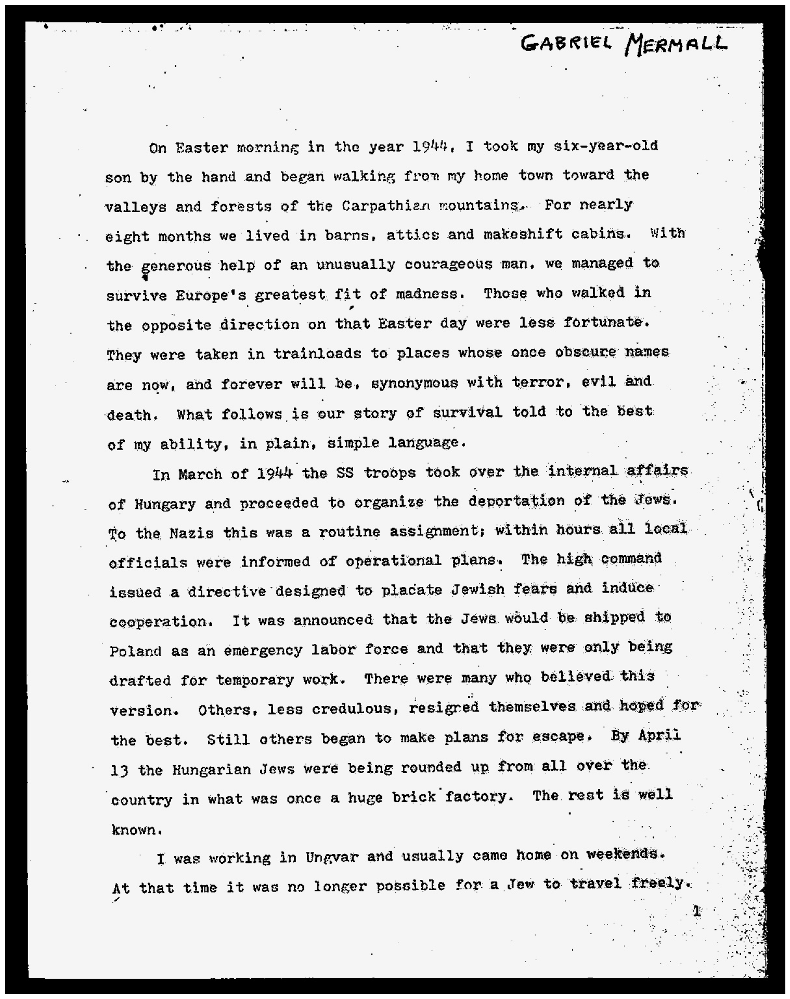

In [8]:
thresh, im_bw = cv2.threshold(gray_image, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite("output/bw_image.jpg", im_bw)
display("output/bw_image.jpg")

Noise Removal

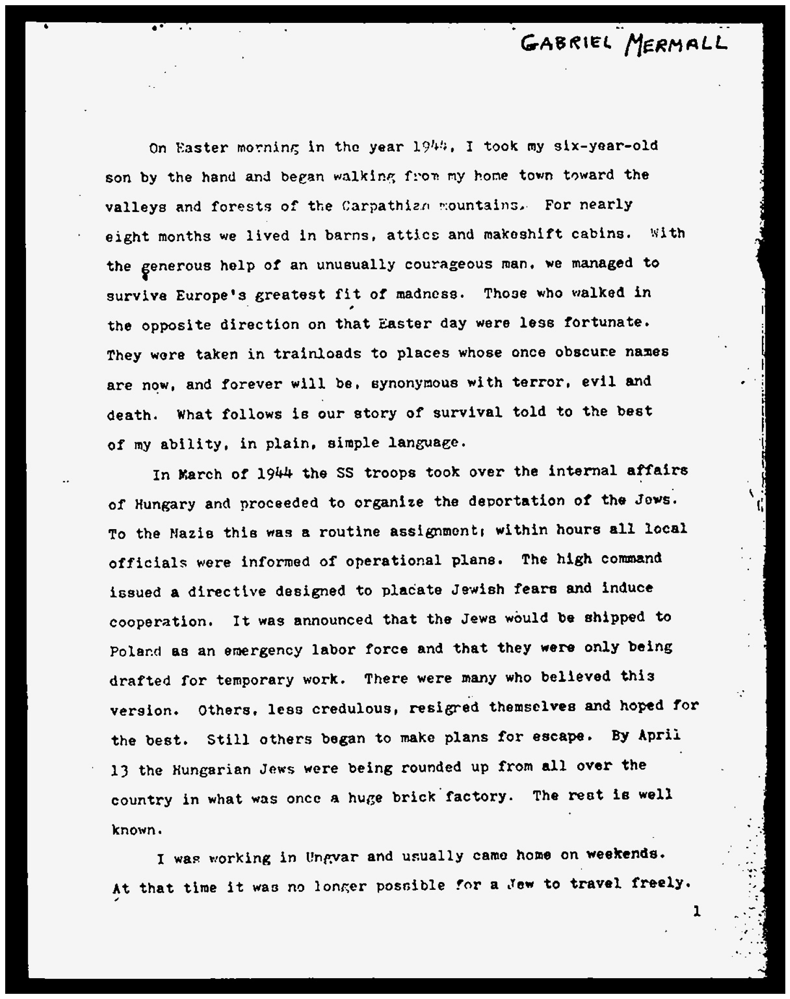

In [9]:
def noise_removal(image):
    kernal = np.ones((1,1), np.uint8)
    image = cv2.dilate(image, kernal, iterations =1)
    kernal = np.ones((1,1), np.uint8)
    image = cv2.erode(image, kernal, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernal)
    image = cv2.medianBlur(image, 3)
    return image
no_noise = noise_removal(im_bw)
cv2.imwrite('output/no_noise.jpg', no_noise)
display('output/no_noise.jpg')

Dilation and Erosion

In [10]:
def thin_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [11]:
erode_img = thin_font(no_noise)
cv2.imwrite('output/erode_img.jpg', erode_img)

True

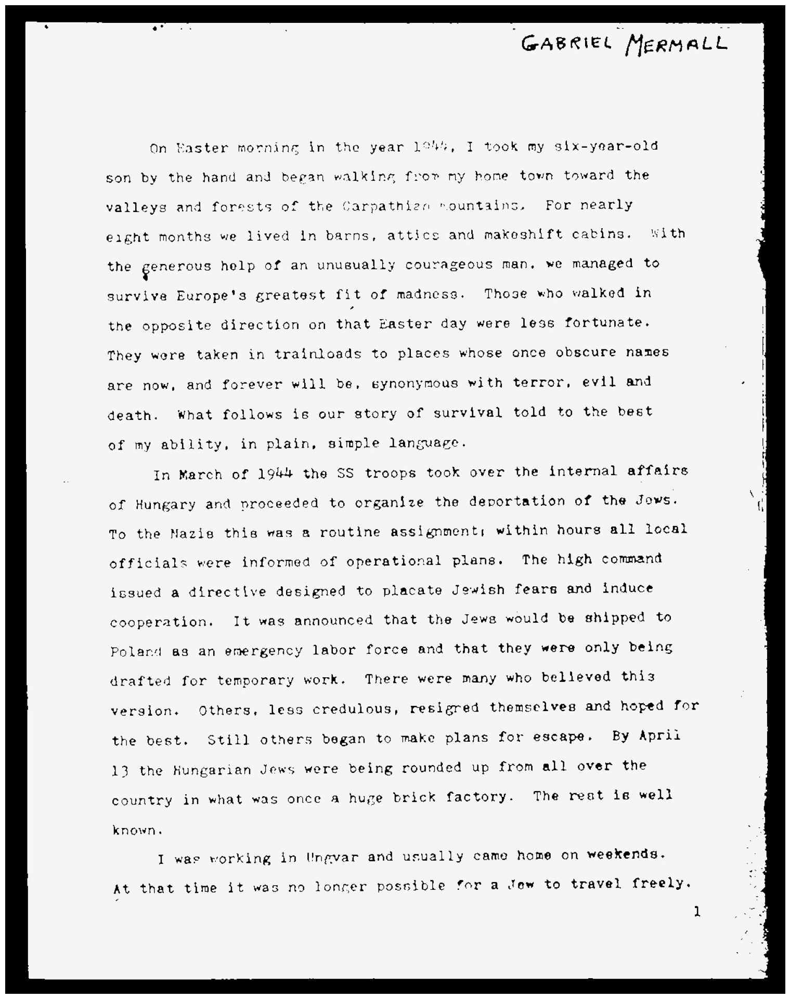

In [12]:
display('output/erode_img.jpg')

In [13]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [14]:
dialated_images = thick_font(no_noise)
cv2.imwrite('output/dialated_img.jpg', dialated_images)


True

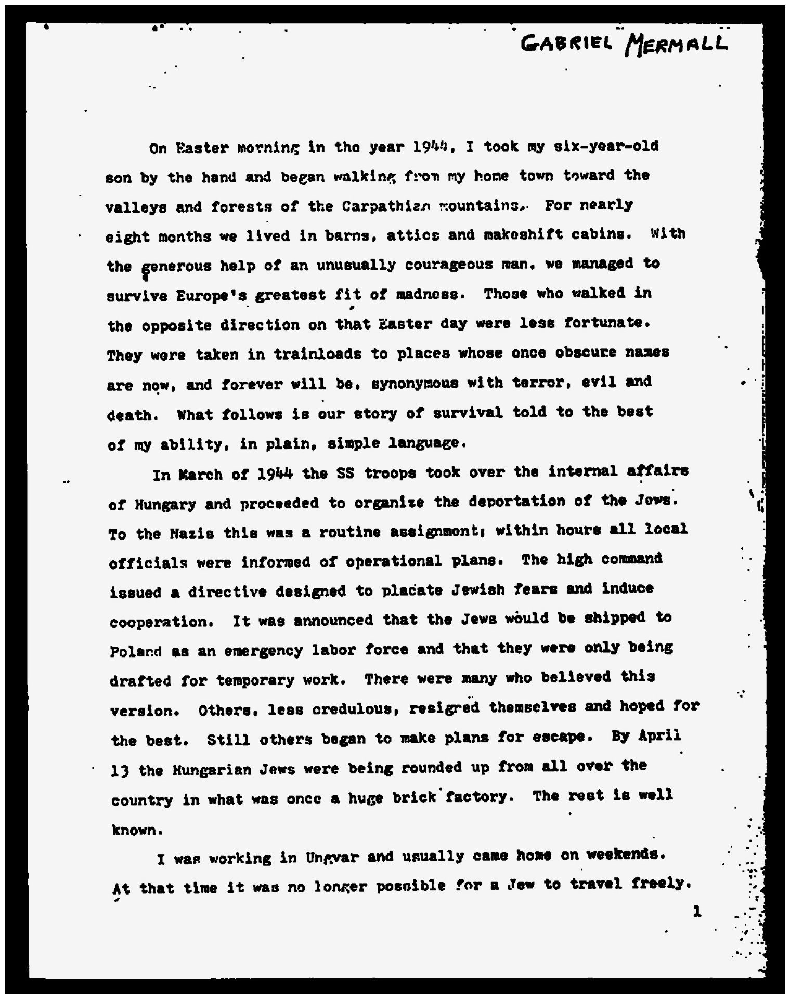

In [15]:
display('output/dialated_img.jpg')

Rotatiom/Deskweing

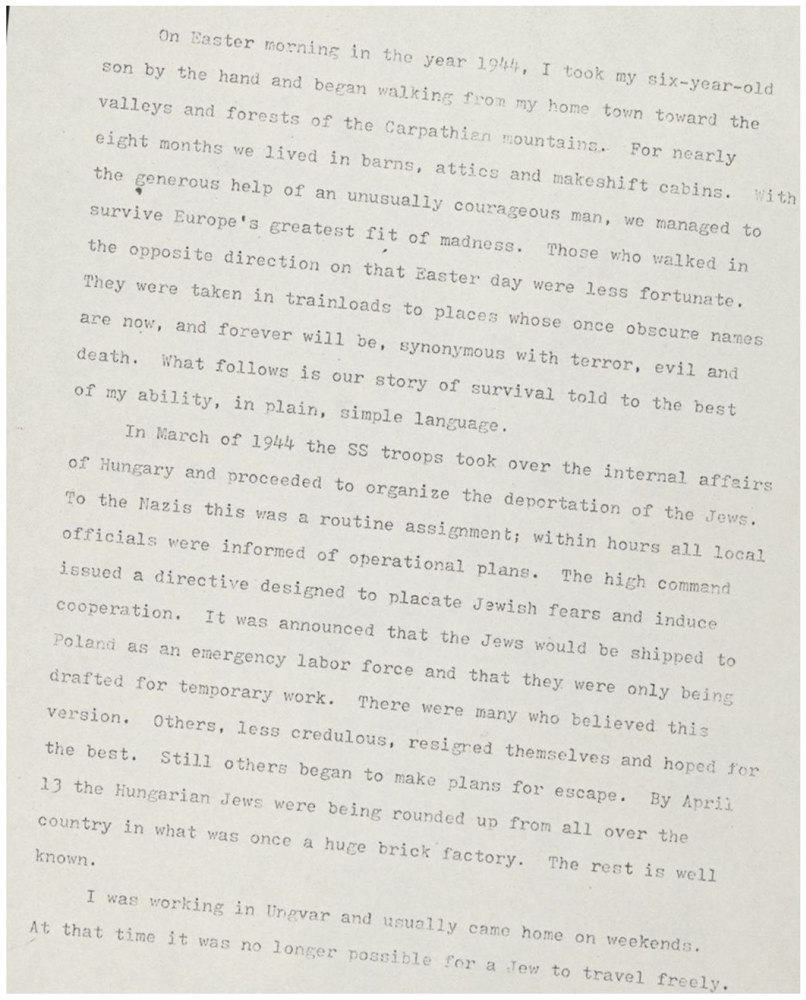

In [16]:
new = cv2.imread("Images/page_01_rotated.JPG")
display("Images/page_01_rotated.JPG")

In [17]:
def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

 Deskew image

In [18]:
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [20]:
fixed = deskew(new)
cv2.imwrite("output/rotated_fixed.jpg", fixed)

28


True

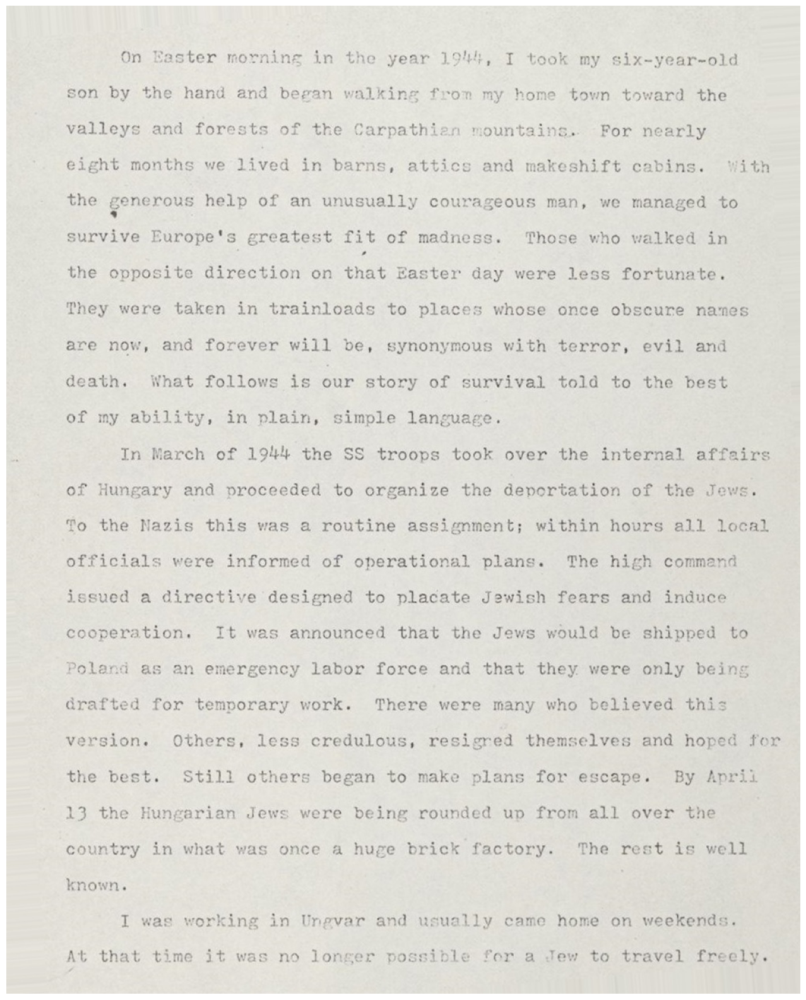

In [21]:
display("output/rotated_fixed.jpg")

Removing Border

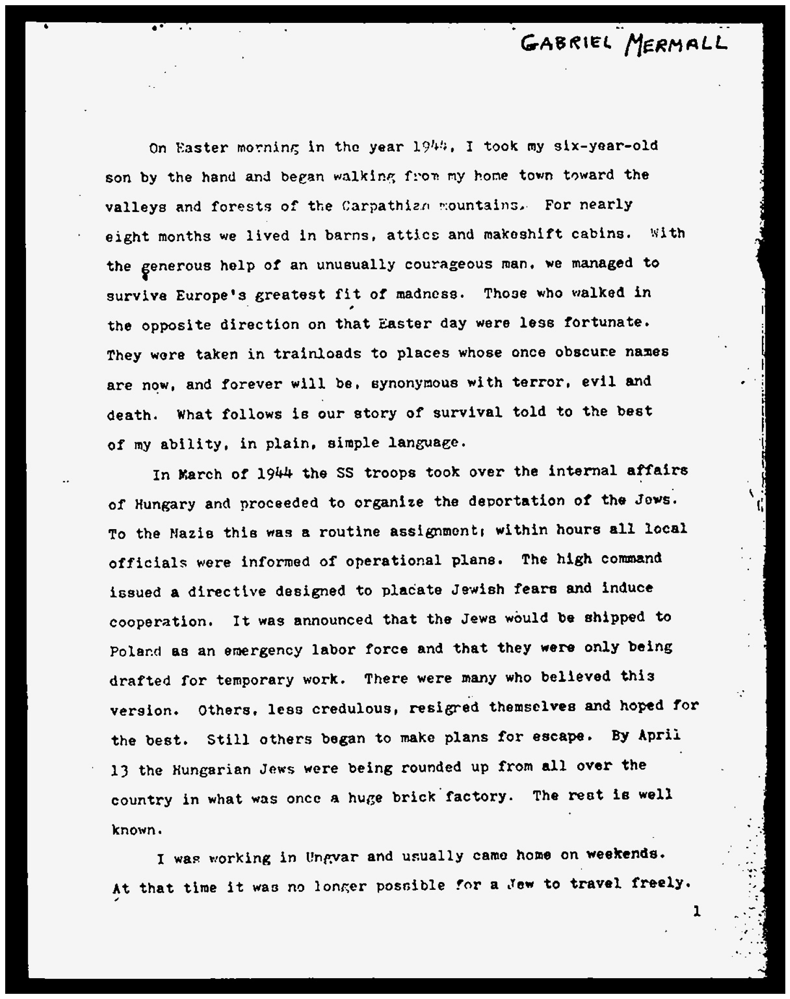

In [23]:
display("output/no_noise.jpg")

In [24]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

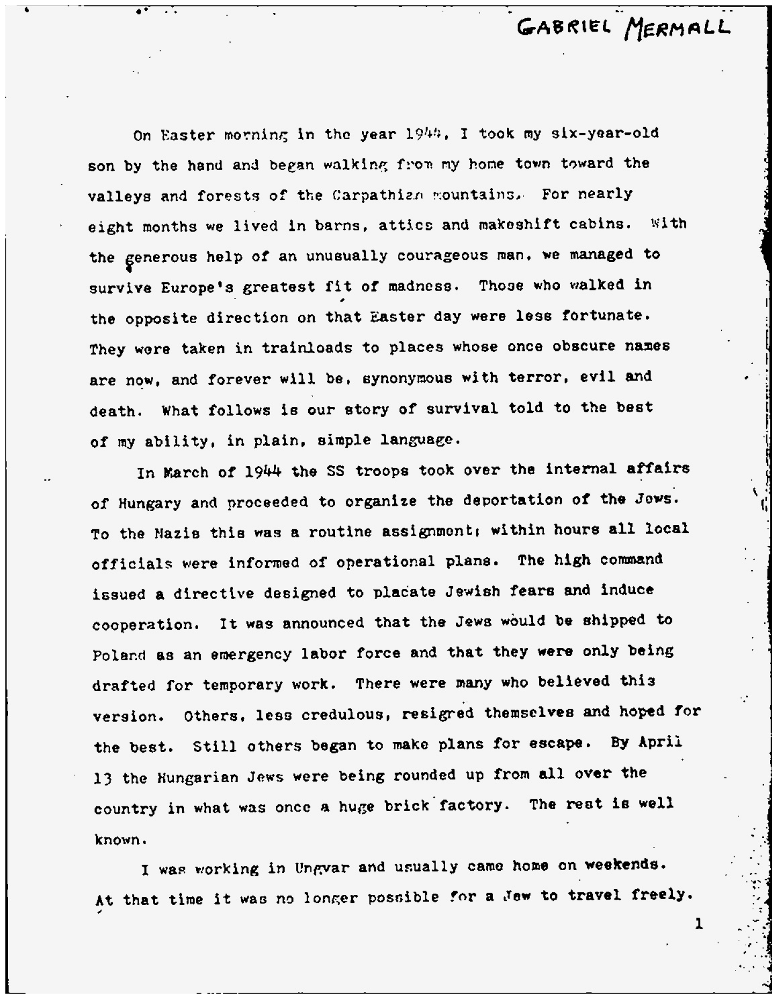

In [25]:
no_borders = remove_borders(no_noise)
cv2.imwrite("output/no_borders.jpg", no_borders)
display('output/no_borders.jpg')

 Missing Borders

In [26]:
color = [255, 255, 255]
top, bottom, left, right = [150]*4

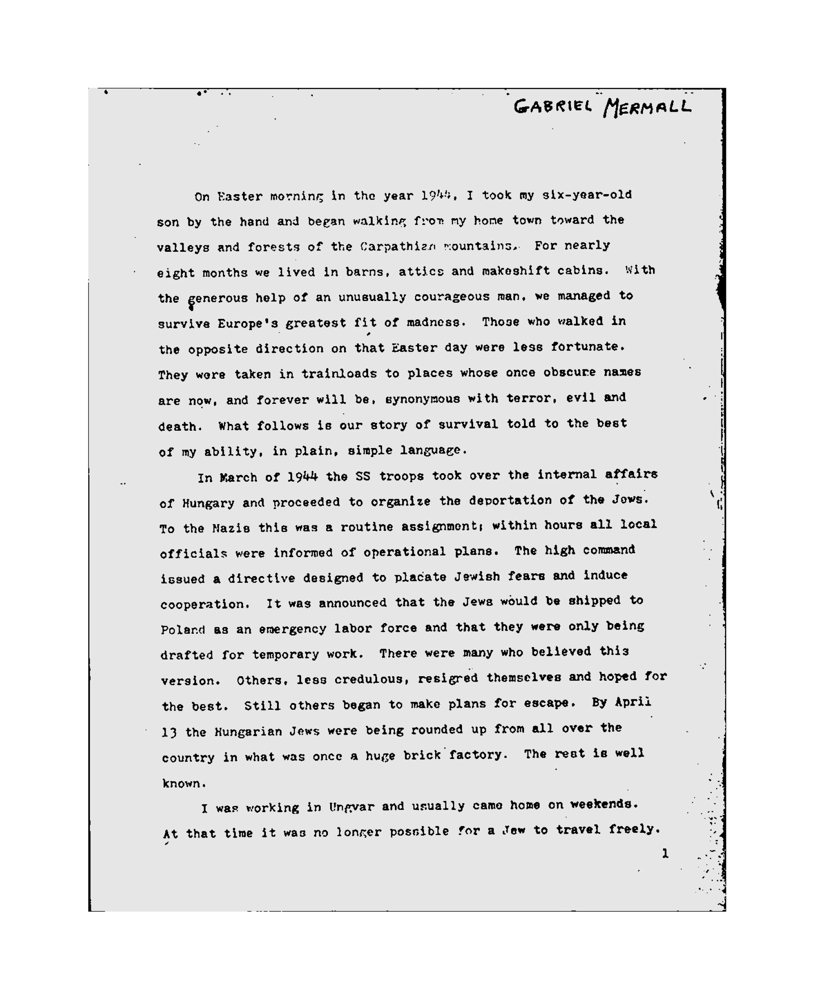

In [27]:
image_with_border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("output/image_with_border.jpg", image_with_border)
display("output/image_with_border.jpg")

Image to Text

In [34]:
img = "Images/page_01.jpg"
no_noise= 'output/no_noise.jpg'
img = Image.open(img)

In [36]:
orc_result = pytesseract.image_to_string(img)
orc_result

' \n\x0c'

In [37]:
orc_result = pytesseract.image_to_string(no_noise)
orc_result

"“GABRIEL Meamall\n\nOn Easter morning in the year 1944, I took my six-year-old\nson by the hand and began walking from my home town toward the\nvalleys and forests of the Carpathi2n mountains. For nearly\neight months we lived in barns, attics and makeshift cabins. With\nthe generous help of an unusually courageous man, we managed to\nsurvive Europe's greatest fit of madness. Those who walked in\nthe opposite direction on that Easter day were lese fortunate.\nThey were taken in trainloads to places whose once obscure names\nare now, and forever will be, synonymous with terror, evil and\ndeath. What follows is our story of survival told to the best\nof my ability, in plain, simple language.\n\nIn March of 1944 the SS troops took over the internal affairs\nof Hungary and proceeded to organize the deportation of the dows.\nTo the Nazie thie was a routine assignment; within hours all local\nofficials were informed of operational plans. The high command\nissued a directive designed to plac